In [1]:
## NLP libs
#For NLP
import re
import nltk
import string
from wordcloud import WordCloud
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.stem.snowball import SnowballStemmer
from sklearn.feature_extraction.text import CountVectorizer
from nltk.corpus import stopwords, wordnet
from nltk import pos_tag, word_tokenize

In [2]:
import missingno as msno #For missing value visualization

In [3]:
import plotly.express as px   ### visual data
import numpy as np 
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.cluster.vq import kmeans, vq
from pylab import plot, show
from matplotlib.lines import Line2D
import matplotlib.colors as mcolors
from sklearn.cluster import KMeans
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn import metrics
from sklearn import neighbors
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import silhouette_score

import warnings
warnings.filterwarnings("ignore")

### Data Review

In [4]:
df = pd.read_csv('book_summary.csv')

In [5]:
df.head()

,index,title,genre,summary
0,0,Drowned Wednesday,fantasy,Drowned Wednesday is the first Trustee among ...
1,1,The Lost Hero,fantasy,"As the book opens, Jason awakens on a school ..."
2,2,The Eyes of the Overworld,fantasy,Cugel is easily persuaded by the merchant Fia...
3,3,Magic's Promise,fantasy,The book opens with Herald-Mage Vanyel return...
4,4,Taran Wanderer,fantasy,Taran and Gurgi have returned to Caer Dallben...


In [6]:
df.shape

(4657, 4)

In [7]:
df.nunique()

index      4657
title      4296
genre        10
summary    4542
dtype: int64

### Missing Value 

In [8]:
df.isnull().sum()

index      0
title      0
genre      0
summary    0
dtype: int64

<AxesSubplot:>

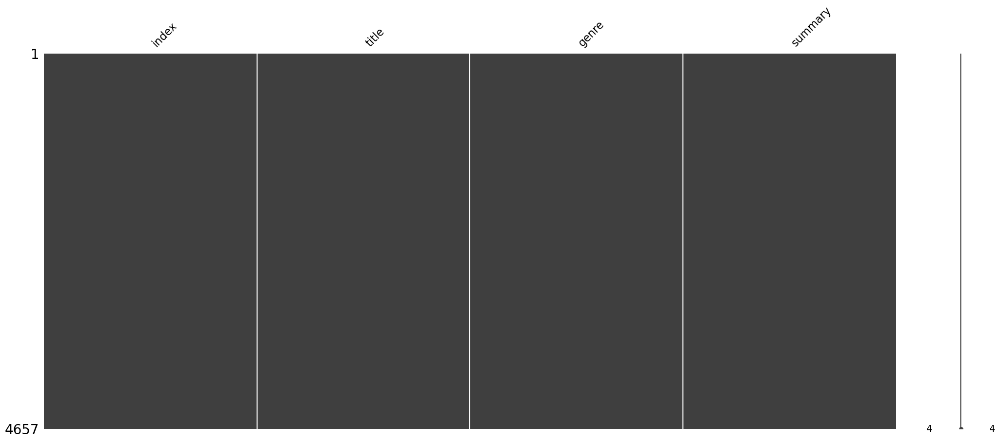

In [9]:
msno.matrix(df)
## khong co missing value

### Data Cleaning

In [10]:
df.drop('index',inplace = True,axis = 1)
df.head()

,title,genre,summary
0,Drowned Wednesday,fantasy,Drowned Wednesday is the first Trustee among ...
1,The Lost Hero,fantasy,"As the book opens, Jason awakens on a school ..."
2,The Eyes of the Overworld,fantasy,Cugel is easily persuaded by the merchant Fia...
3,Magic's Promise,fantasy,The book opens with Herald-Mage Vanyel return...
4,Taran Wanderer,fantasy,Taran and Gurgi have returned to Caer Dallben...


In [11]:
### Kiem tra cot summary
df['summary'][14]

' The book is set in a world where colour is the foundation for all magic. Sixteen years after a war that rocked the world, the Prism receives a note from a lady named Lina, first telling him of the existence of and then telling him to come and get his now 15 year old son, a bastard child that had been conceived while he was betrothed to Karris White Oak, a member of the most elite bodyguard force, the Blackguard. The White sends Karris to Garriston, Tyrea\'s capital, to spy on its Satrap\'s army. She gives Karris a note informing her of Gavin\'s unfaithfulness, instructing her to not read it until after leaving the Chromeria (the center of magical learning). She sends Gavin to kill a color wight somewhere else, attempting to keep the two separated until well after Karris learned the news. However, Gavin chooses to bring Karris to Garriston himself before she can read the note, using a mode of transportation no one else even believes possible: magically-aided flight across the ocean. T

In [12]:
### Clean data 
def clean(text):
    text = text.lower() #Converting to lowerCase
    text = re.sub('[%s]' % re.escape(string.punctuation), ' ',text) #removing punctuation
    
    text_tokens = word_tokenize(text) #removing stopwords
    tw = [word for word in text_tokens if not word in stopwords.words('english')]
    text = (" ").join(tw)
    
    splt = text.split(' ')
    output = [x for x in splt if len(x) > 3] #removing words with length<=3
    text = (" ").join(output)
    
    text = re.sub(r"\s+[a-zA-Z]\s+", ' ', text) #removing single character 
    text = re.sub('<.*?>+',' ',text) #removing HTML Tags
    text = re.sub('\n', ' ',text) #removal of new line characters
    text = re.sub(r'\s+', ' ',text) #removal of multiple spaces
    return text

In [13]:
df['summary'] = df['summary'].apply(clean)
df['title'] = df['title'].apply(clean)

In [14]:
# Remove numbers, only keep letters
df['summary'] = df['summary'].replace('[\w]*\d+[\w]*', '', regex=True)

### EDA stage

In [15]:
### xem so luong tung the loai
df['genre'].value_counts()

thriller      1023
fantasy        876
science        647
history        600
horror         600
crime          500
romance        111
psychology     100
sports         100
travel         100
Name: genre, dtype: int64

In [16]:
###Visual Gerne
genre_df = pd.DataFrame({'genre':['thriller','fantasy','science','history','horror','crime','romance',
                                'psychology','sports','travel'],'count':[1023,876,647,600,600,500,111,
                                                                        100,100,100]})
fig = px.histogram(genre_df,x = 'genre',y = 'count',color = 'genre')
fig.show()

In [17]:
### WordCloud Analysis
def print_wordCloud(genre,summary):
    print(genre)
    wordcloud = WordCloud(width = 400, height = 400, 
                background_color ='white', 
                min_font_size = 10).generate(summary)
    plt.figure(figsize = (7, 7), facecolor = 'white', edgecolor='blue') 
    plt.imshow(wordcloud) 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.show()
def make_string(genre):
    s = ""
    for row_index,row in df.iterrows():
        if(row['genre'] == genre):
            s+=(row['summary']+' ')
    return s

thriller


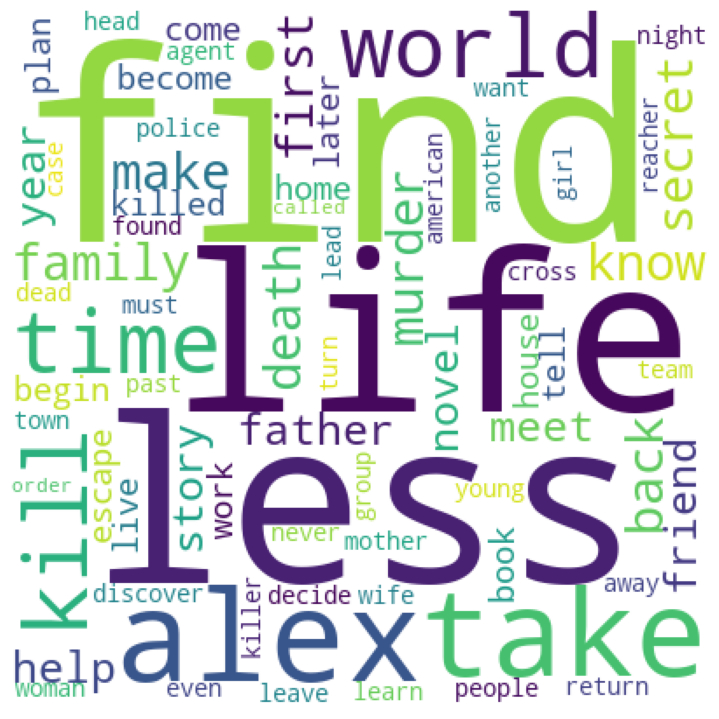

fantasy


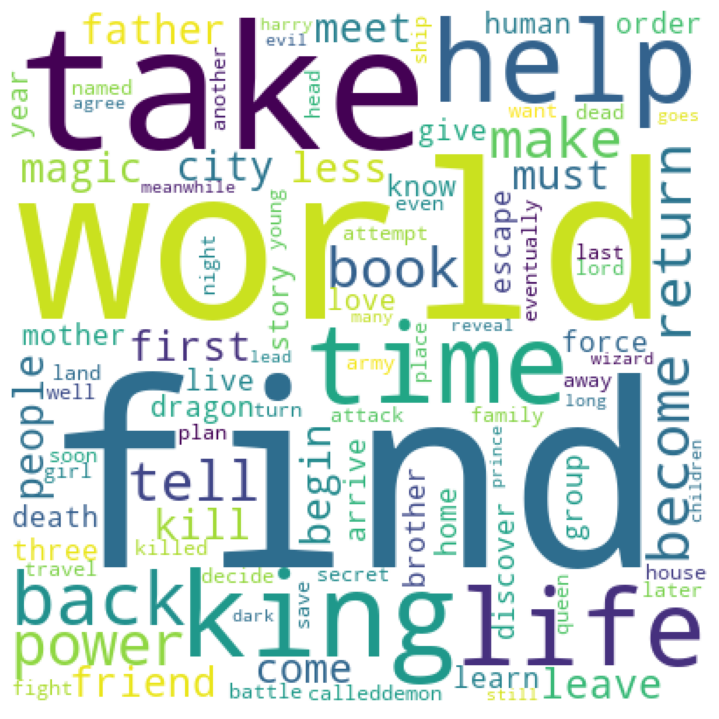

science


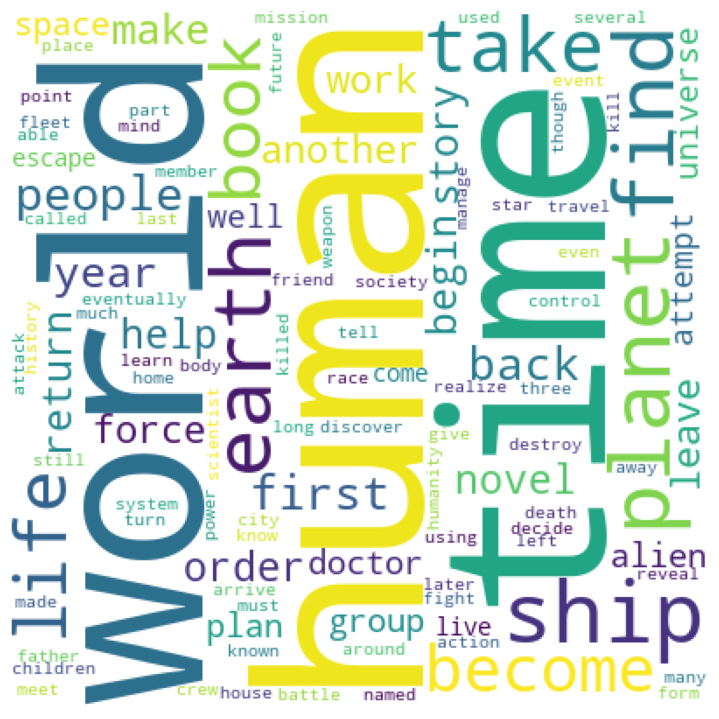

history


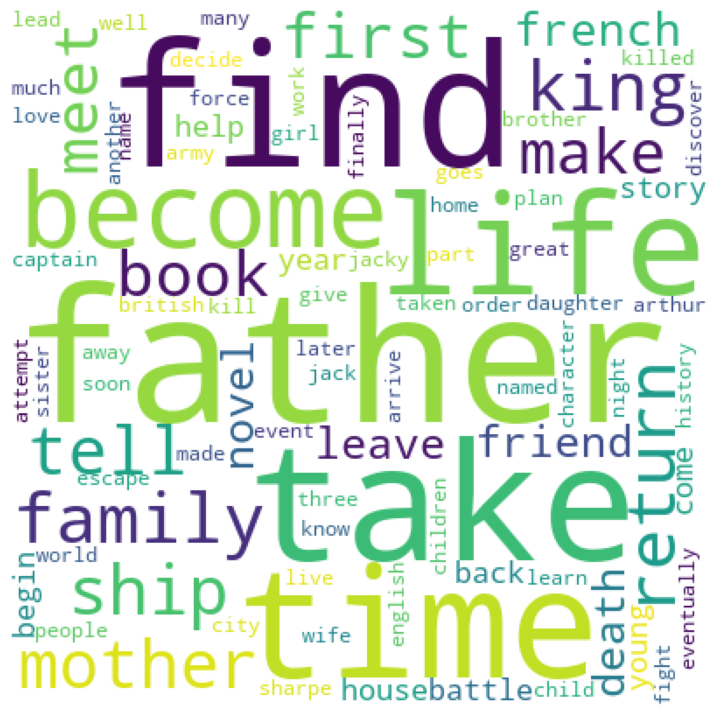

horror


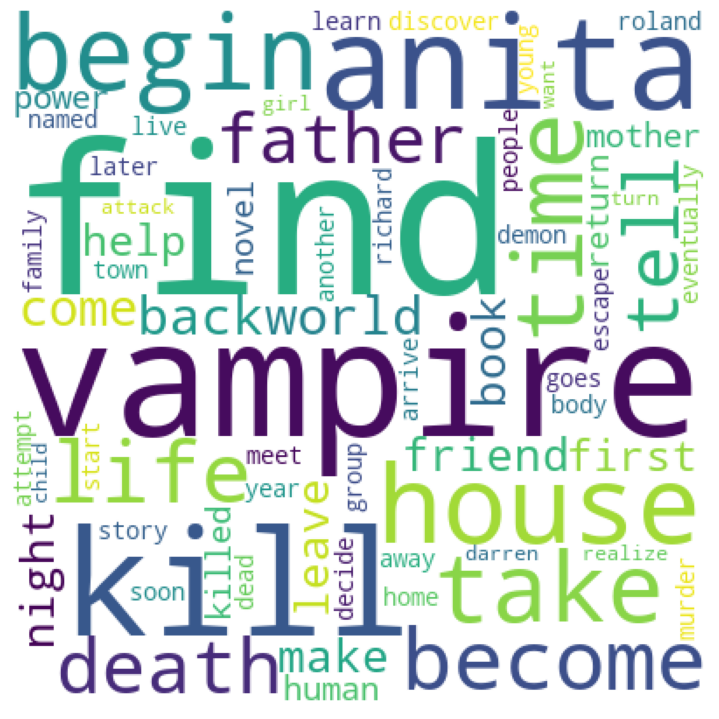

crime


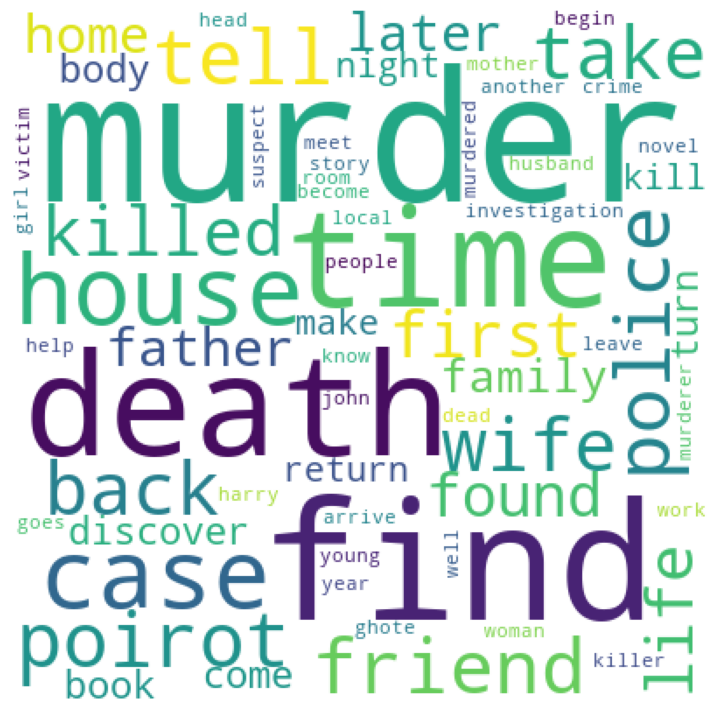

romance


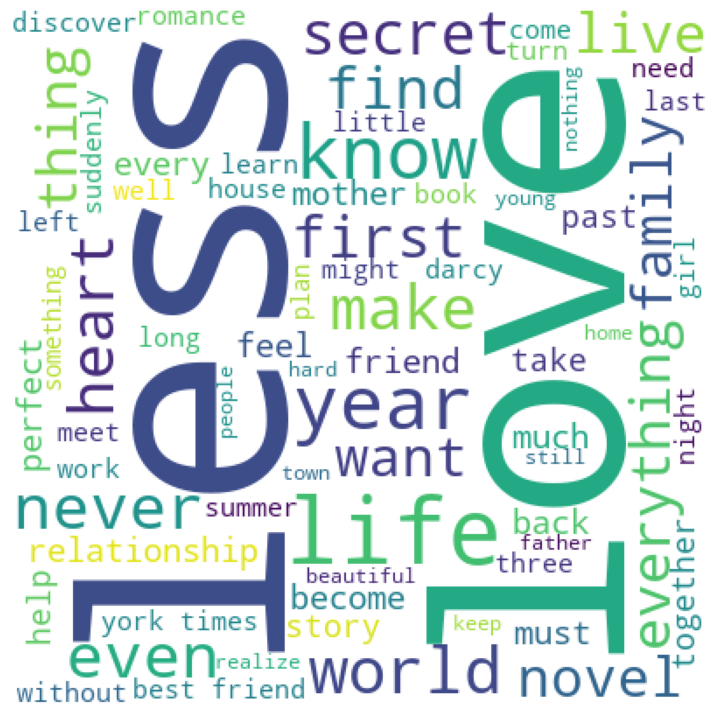

psychology


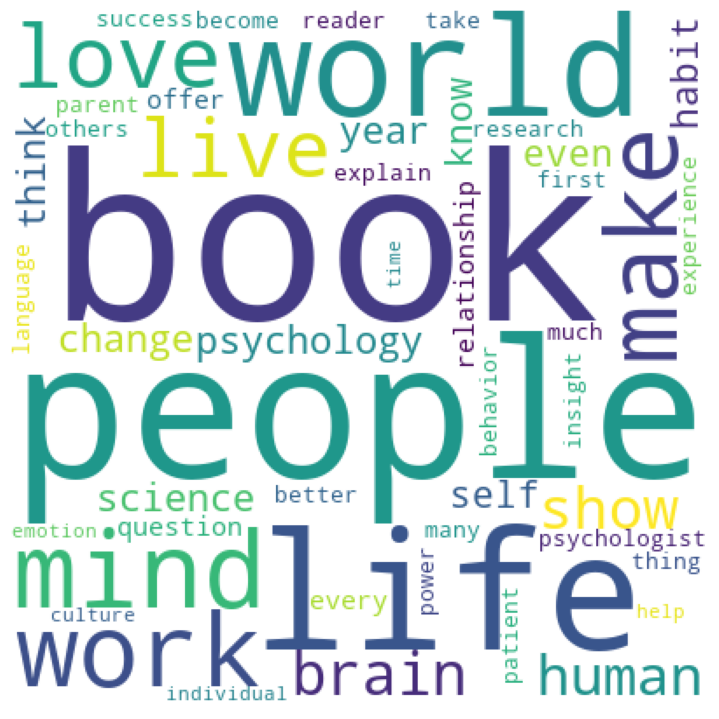

sports


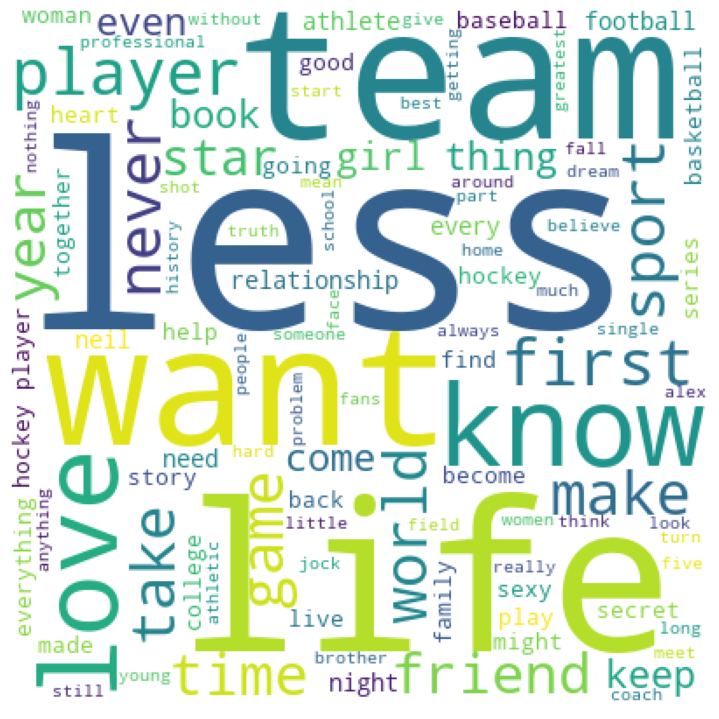

travel


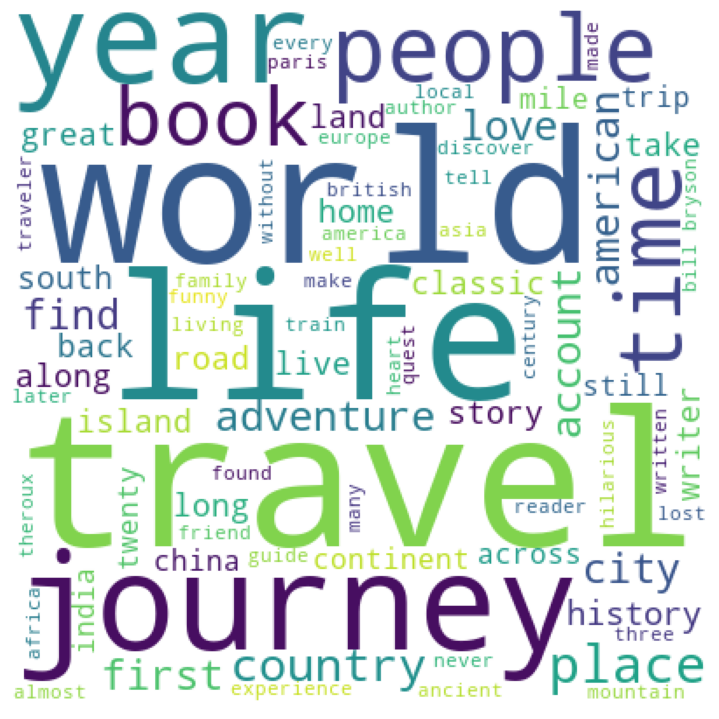

In [18]:
genre = ['thriller','fantasy','science','history','horror','crime','romance',
                                'psychology','sports','travel']
for Genre in genre:
    summary = make_string(Genre)
    print_wordCloud(Genre,summary)

In [19]:
def data_preprocessing(text):
    tokens = word_tokenize(text) #Tokenization
    tokens = [WordNetLemmatizer().lemmatize(word) for word in tokens] #Lemmetization
    tokens = [SnowballStemmer(language = 'english').stem(word) for word in tokens] #Stemming
    return " ".join(tokens)

In [20]:
df_new = df['summary'].apply(data_preprocessing)
df_new

0       drown wednesday first truste among morrow day ...
1       book open jason awaken school unabl rememb any...
2       cugel easili persuad merchant fianosth attempt...
3       book open herald mage vanyel return countri va...
4       taran gurgi return caer dallben follow event t...
                              ...                        
4652    atticus sullivan last druid life peac arizona ...
4653    charli bucket wonder adventur begin find willi...
4654    live dream child born free say like land fathe...
4655    rose love dimitri dimitri might love tasha mas...
4656    princ valu brishen khaskem princ live content ...
Name: summary, Length: 4657, dtype: object

### Buil Model

### TFIDF

In [21]:
tfidf_vect = TfidfVectorizer(ngram_range=(1,2), min_df=0.02)
tfidf = tfidf_vect.fit_transform(df['summary'].values)
tfidf.shape

(4657, 1304)

### GaussianMixture

In [22]:
df_gmm = pd.DataFrame(tfidf.toarray(), columns=tfidf_vect.get_feature_names())

In [23]:
import multiprocess as mp
from itertools import repeat
from datetime import datetime

In [24]:
from sklearn.mixture import GaussianMixture

In [25]:
Min_k =2
Max_k = 9
K = range(Min_k, Max_k+1)

In [26]:
def gmm_test(dataframe, k):
    from sklearn.mixture import GaussianMixture
    from sklearn import metrics
    from sklearn.metrics import silhouette_score

    gmm = GaussianMixture(n_components=k, random_state=42)
    gmm.fit(dataframe)

    return (silhouette_score(dataframe, gmm.predict(dataframe)), gmm)

In [27]:
start_time = datetime.now()
a_pool = mp.Pool(processes=(Max_k - Min_k +1))
results = a_pool.starmap(gmm_test, zip(repeat(df_gmm),K))
end_time=datetime.now()
print('duration:', end_time - start_time)

duration: 0:00:30.662964


In [28]:
from myhelpers import silhouette_plot

In [29]:
gmm_clustering_silhouettes = {}
gmm_clustering_models = {}
i = Min_k
for ret in results:
    gmm_clustering_silhouettes[i] = ret[0]
    gmm_clustering_models[i] = ret[1]
    i = i + 1

Text(0, 0.5, 'Silhouette score')

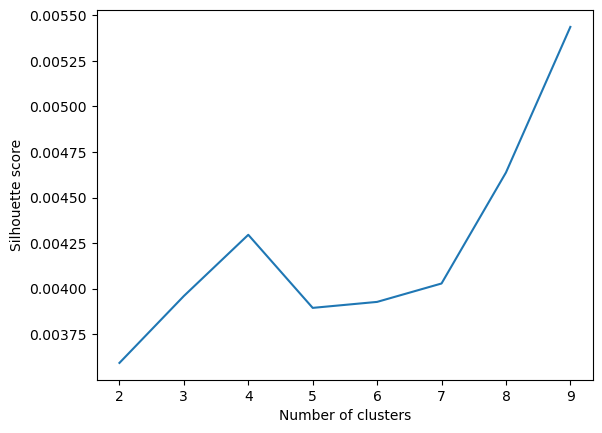

In [30]:
# Plot the silhouette graph
plt.plot(K, gmm_clustering_silhouettes.values())
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette score')

For n_clusters = 2 The average silhouette_score is : 0.0035929765347169833
For n_clusters = 3 The average silhouette_score is : 0.003960076802305691
For n_clusters = 4 The average silhouette_score is : 0.004295898218180424
For n_clusters = 5 The average silhouette_score is : 0.00389498375350344
For n_clusters = 6 The average silhouette_score is : 0.003927793174469692
For n_clusters = 7 The average silhouette_score is : 0.004028746433982861
For n_clusters = 8 The average silhouette_score is : 0.004637404472824887
For n_clusters = 9 The average silhouette_score is : 0.005436356591911749


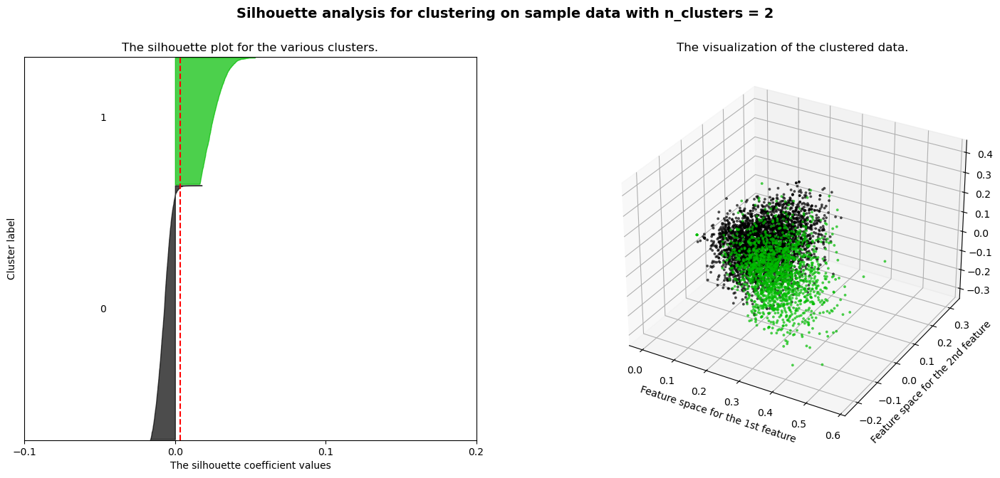

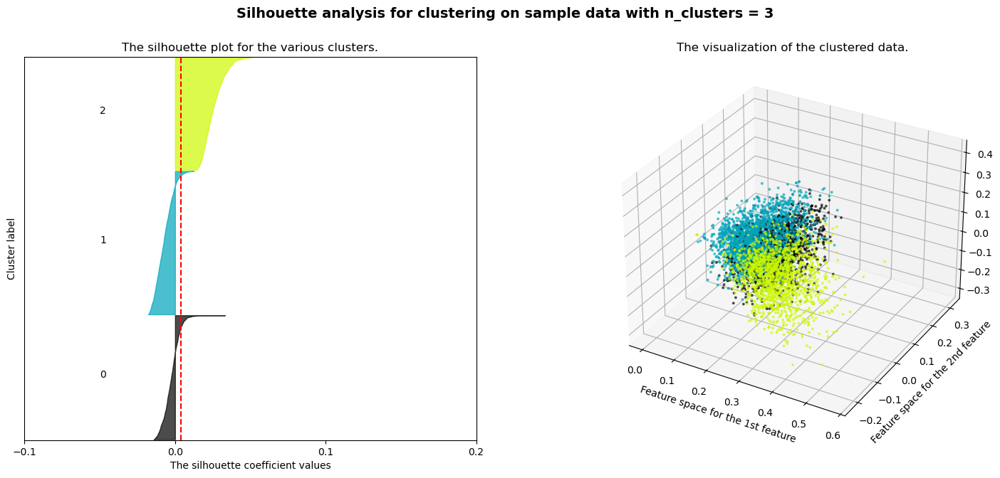

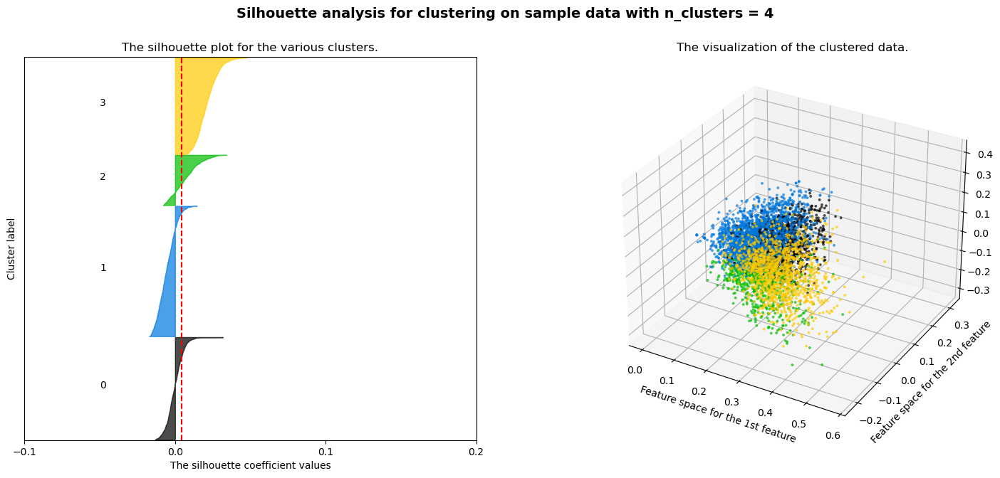

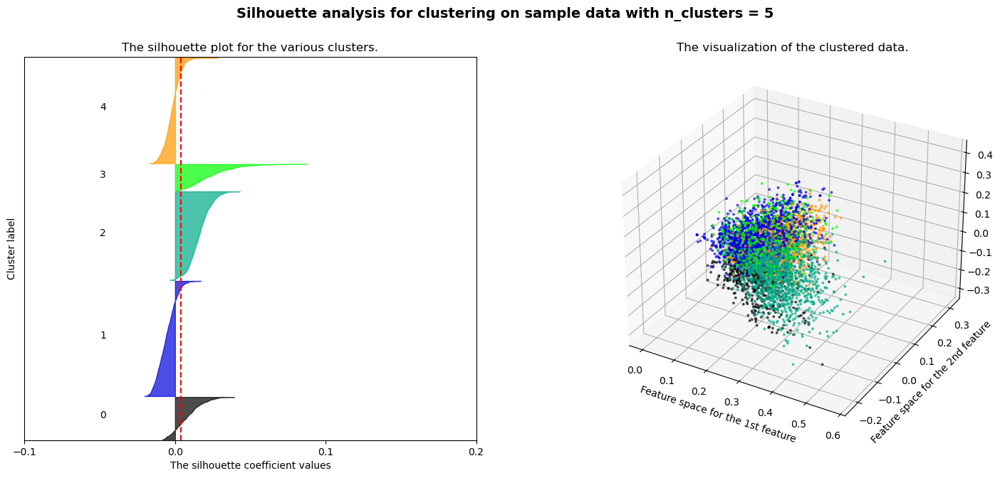

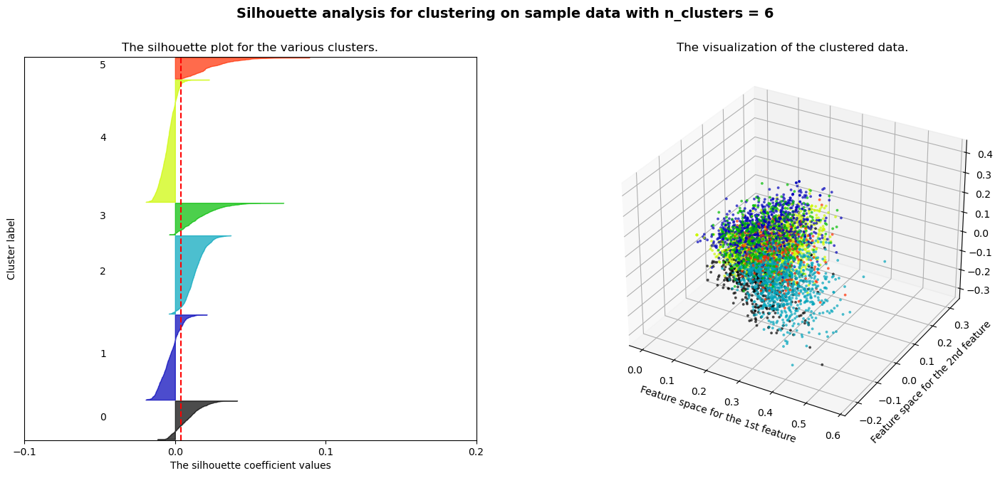

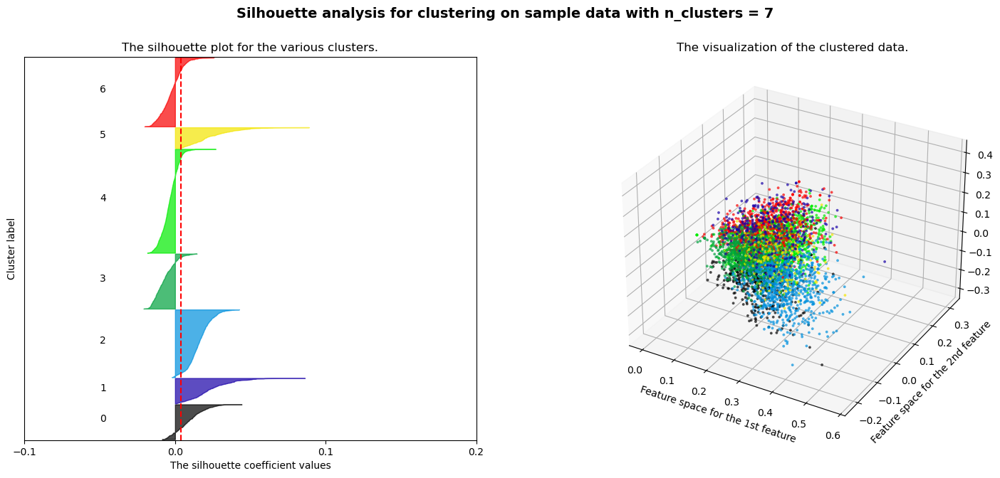

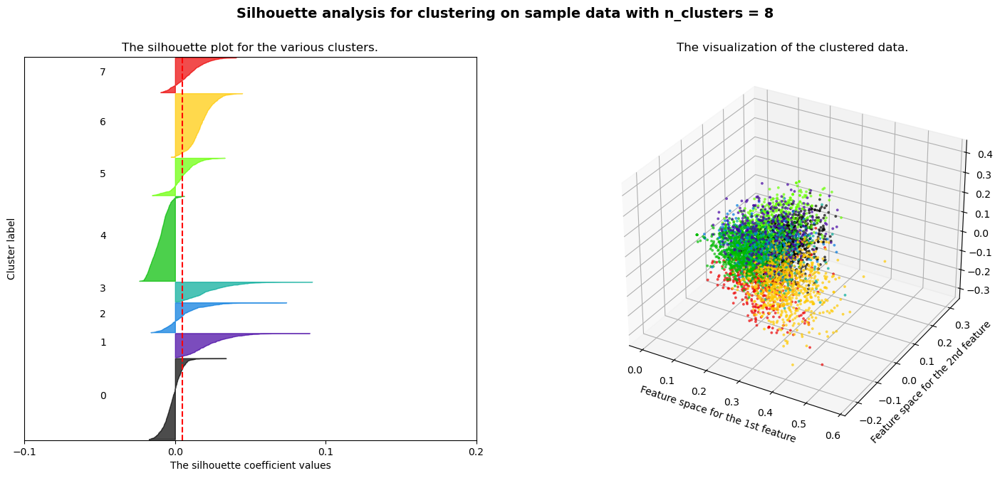

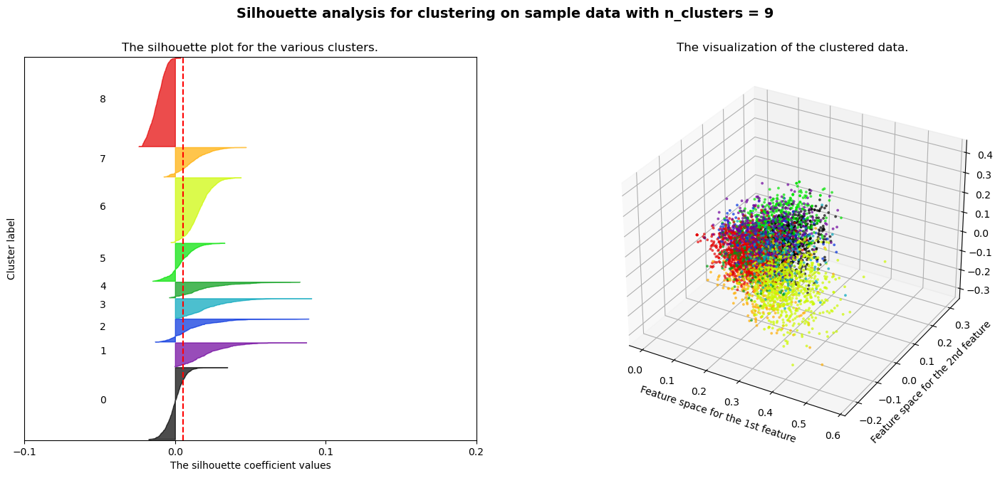

In [31]:
silhouette_plot.silhouette_plot(Max_k, df_gmm, gmm_clustering_models, gmm_clustering_silhouettes)

#### Kmeans

In [32]:
def kmean_test(df, k):
    from sklearn.cluster import KMeans
    from sklearn import metrics
    from scipy.spatial.distance import cdist
    import numpy as np

    kmeanModel = KMeans(n_clusters=k, n_init=20, max_iter=1000, random_state=42)
    kmeanModel.fit(df)

    return (kmeanModel.inertia_,
            metrics.silhouette_score(df, kmeanModel.labels_, metric='euclidean'),
            kmeanModel)

In [33]:
start_time = datetime.now()
a_pool = mp.Pool(processes=(Max_k - Min_k +1))
results = a_pool.starmap(kmean_test, zip(repeat(df_gmm),K))
end_time=datetime.now()
print('duration:', end_time - start_time)

duration: 0:00:25.429146


In [34]:
kmeans_distortions = []
kmeans_silhouettes = {}
kmean_models = {}
for ret in results:
    kmeans_distortions.append(ret[0])
    kmeans_silhouettes[ret[2].n_clusters] = ret[1]
    kmean_models[ret[2].n_clusters] = ret[2]

Text(0.5, 1.0, 'The Elbow Method showing the optimal k')

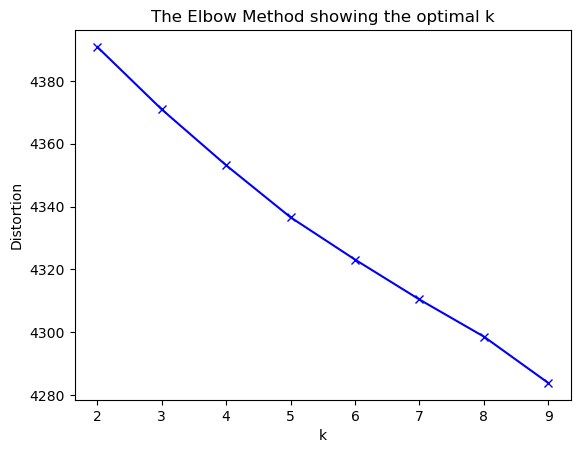

In [35]:
# Plot the elbow curve
plt.plot(K, kmeans_distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')

Text(0, 0.5, 'Silhouette score')

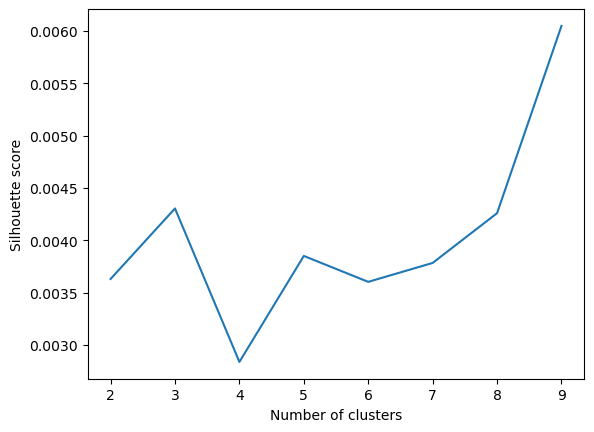

In [36]:
# Plot the silhouette graph
plt.plot(K, kmeans_silhouettes.values())
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette score')

For n_clusters = 2 The average silhouette_score is : 0.003629552075229854
For n_clusters = 3 The average silhouette_score is : 0.004304089416819706
For n_clusters = 4 The average silhouette_score is : 0.002836813194852597
For n_clusters = 5 The average silhouette_score is : 0.0038499724928116714
For n_clusters = 6 The average silhouette_score is : 0.003602360263078413
For n_clusters = 7 The average silhouette_score is : 0.0037831000910423258
For n_clusters = 8 The average silhouette_score is : 0.0042588244594984415
For n_clusters = 9 The average silhouette_score is : 0.006048948812333081


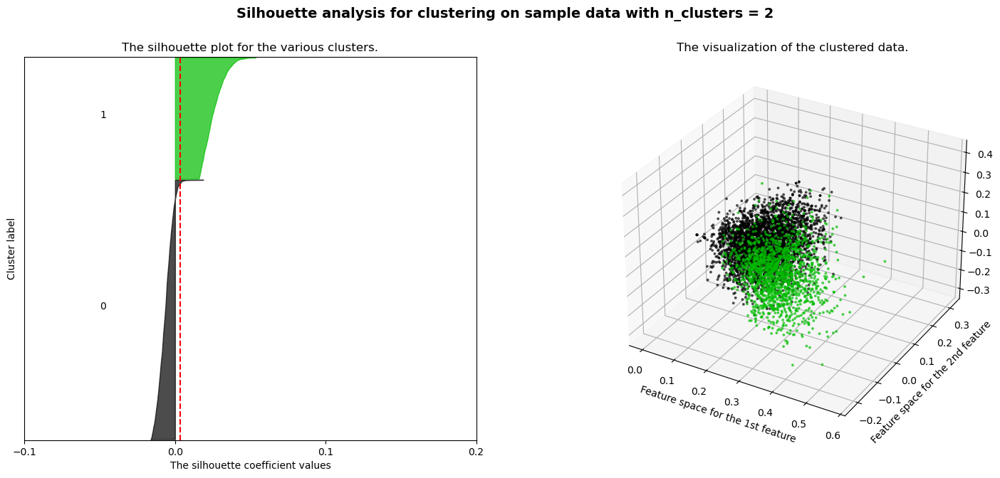

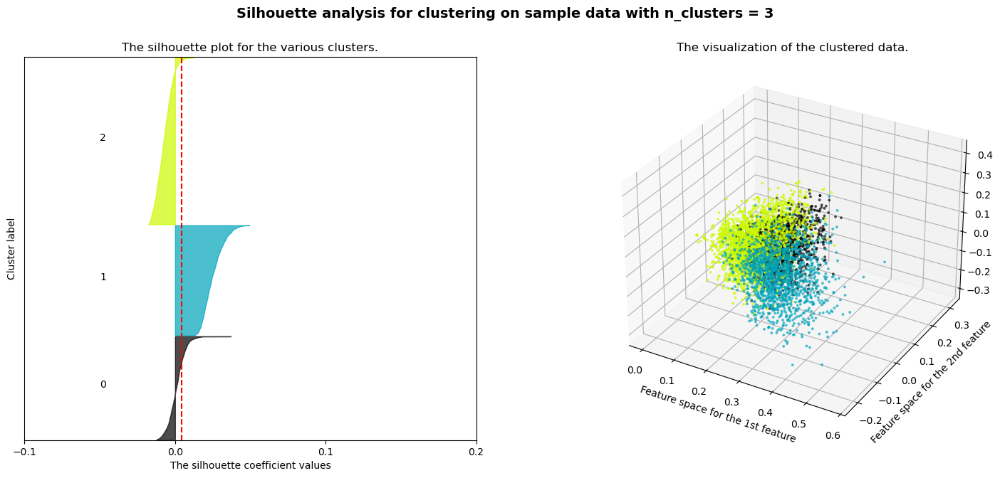

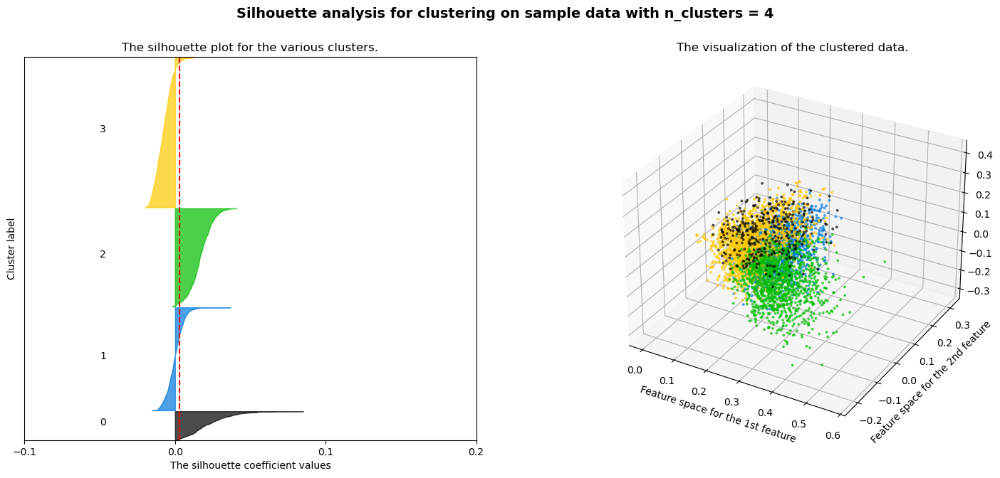

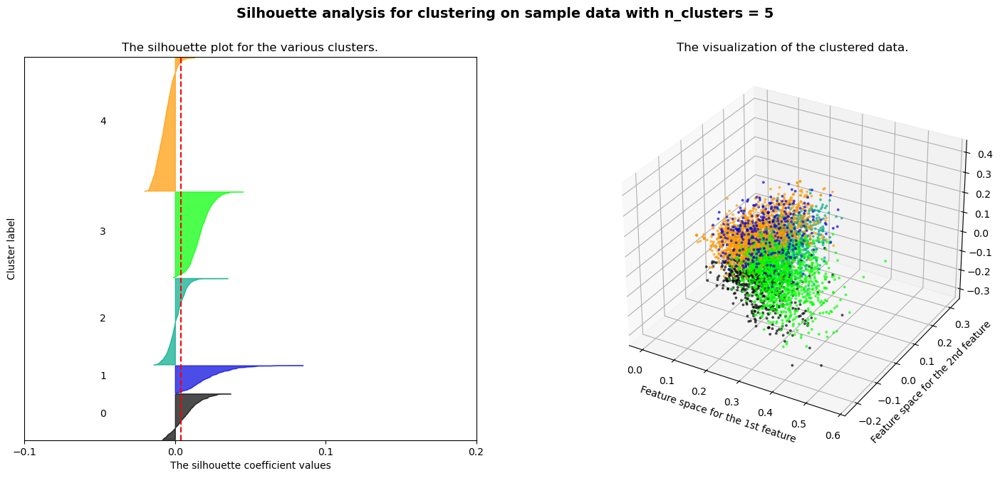

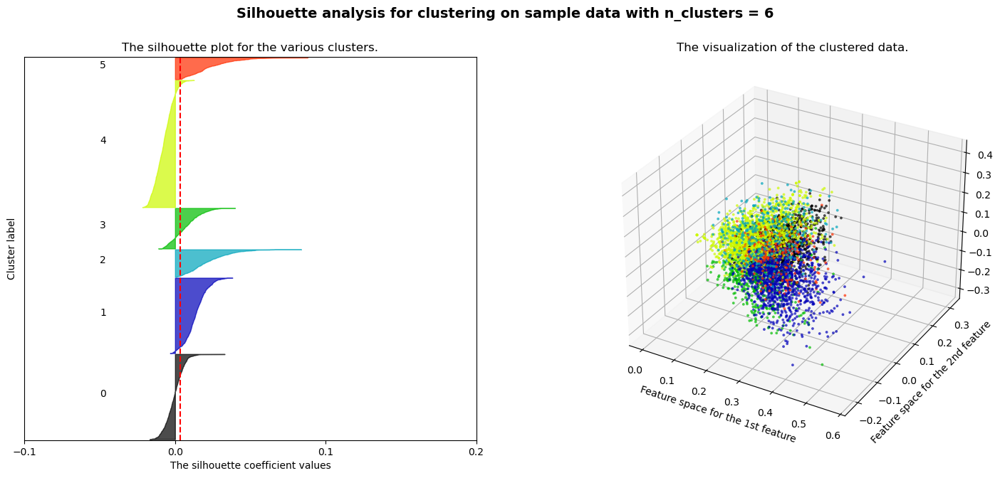

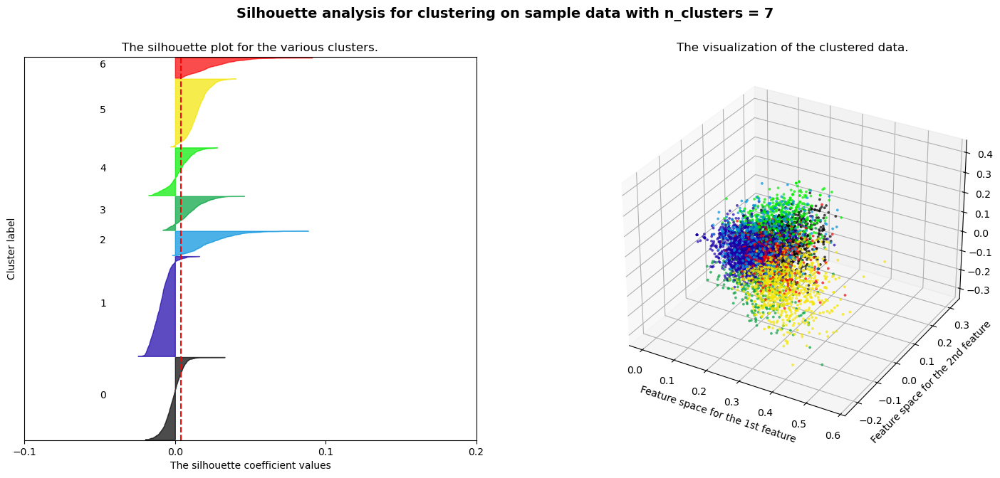

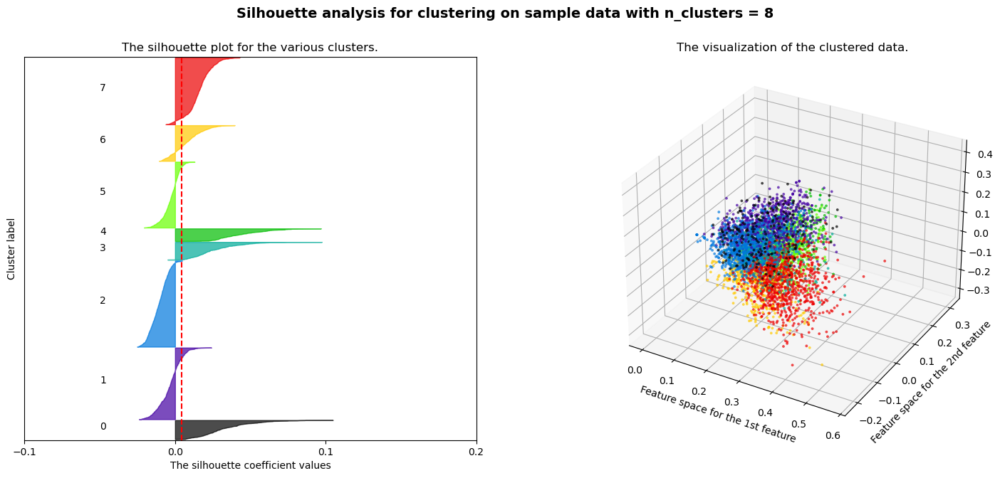

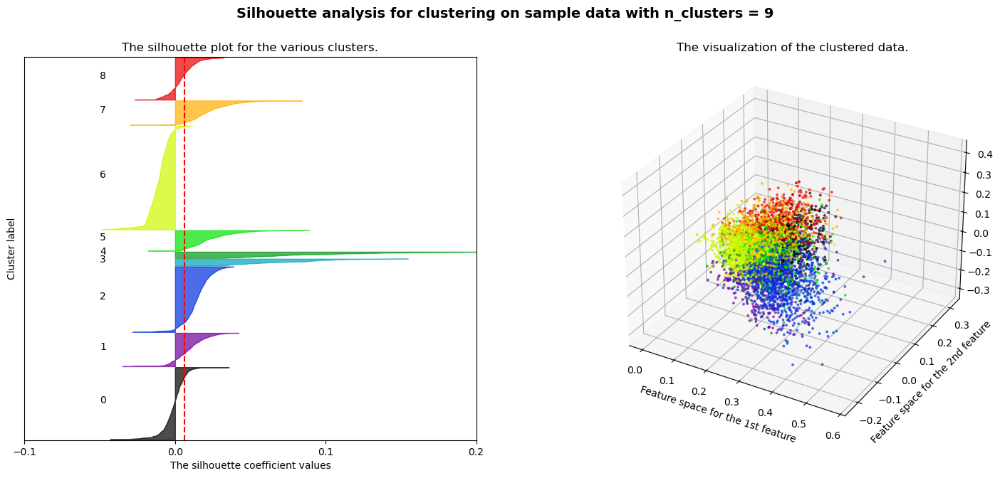

In [37]:
silhouette_plot.silhouette_plot(Max_k, df_gmm, kmean_models, kmeans_silhouettes)

### Nhận xét:
- Both ML models (GMM and Kmeans) did not give us a good result
- The data was also scattered among the clusters
- 5 clusters, would be appropriate result
- with 5 clusters, GMM model is better than Kmeans, because higher Silhouette, data is less likely to be misclassified across other clusters

#### Best Model

In [41]:
gmm = GaussianMixture(n_components=5, random_state=42)

In [43]:
gmm.fit(df_gmm)

GaussianMixture(n_components=5, random_state=42)

In [45]:
y_pred = gmm.predict(df_gmm)

In [46]:
df['Cluster']= y_pred

In [47]:
df.head()

,title,genre,summary,Cluster
0,drowned wednesday,fantasy,drowned wednesday first trustee among morrow d...,3
1,lost hero,fantasy,book opens jason awakens school unable remembe...,2
2,eyes overworld,fantasy,cugel easily persuaded merchant fianosther att...,1
3,magic promise,fantasy,book opens herald mage vanyel returning countr...,2
4,taran wanderer,fantasy,taran gurgi returned caer dallben following ev...,2
